In [10]:
import pandas as pd
df = pd.read_csv('Crimes_-_Map.csv')
# This is the function that we will use to calculate the r squared value for the data. 
# It uses index column 0 and x and 1 as y where we use x to predict y. 
# the function goes calculate_r_squared(dataframe, x_idx, y_idx) where x_idx and y_idx are the index of the columns 
# that we want to use to calculate the r squared value. 
import seaborn as sns

In [11]:
# Clean up some data to make the datasets work together.
df = df.drop(df[df['BEAT'] == 1651].index)
df = df.drop(df[df['BEAT'] == 1654].index)
df = df.drop(df[df['BEAT'] == 1655].index)
df = df.drop(df[df['BEAT'] == 1650].index)
df

,CASE#,DATE_OF_OCCURRENCE,BLOCK,IUCR,PRIMARY_DESCRIPTION,SECONDARY_DESCRIPTION,LOCATION_DESCRIPTION,ARREST,DOMESTIC,BEAT,WARD,FBI CD,X COORDINATE,Y COORDINATE,LATITUDE,LONGITUDE,LOCATION,DATE_OF_OCCURENCE
0,JG406115,2023-08-31 19:00:00,042XX W MARQUETTE RD,0498,BATTERY,"AGG. DOMESTIC BATTERY - HANDS, FISTS, FEET, SE...",APARTMENT,Y,Y,833,23.0,04B,1149062.0,1859830.0,41.771296,-87.729149,"(41.771296232, -87.729149311)",2023-08-31 19:00:00
1,JG425966,2023-09-15 23:20:00,010XX W 84TH ST,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,N,Y,613,17.0,08B,1170922.0,1849120.0,41.741457,-87.649330,"(41.74145726, -87.649330096)",2023-09-15 23:20:00
2,JG412467,2023-08-31 21:13:00,093XX S WABASH AVE,0910,MOTOR VEHICLE THEFT,AUTOMOBILE,STREET,N,N,634,6.0,07,1178354.0,1843057.0,41.724654,-87.622283,"(41.724654303, -87.622283278)",2023-08-31 21:13:00
3,JG426285,2023-09-15 18:00:00,057XX S DR MARTIN LUTHER KING JR DR,1320,CRIMINAL DAMAGE,TO VEHICLE,PARKING LOT / GARAGE (NON RESIDENTIAL),N,N,232,20.0,14,1179905.0,1867002.0,41.790327,-87.615871,"(41.790326702, -87.615870527)",2023-09-15 18:00:00
4,JG425774,2023-09-15 17:29:00,017XX E 95TH ST,0860,THEFT,RETAIL THEFT,SMALL RETAIL STORE,N,N,431,7.0,06,1189459.0,1842326.0,41.722389,-87.581630,"(41.722389451, -87.581629631)",2023-09-15 17:29:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
257326,JG203846,2023-03-29 17:59:00,016XX W 47TH ST,0860,THEFT,RETAIL THEFT,SMALL RETAIL STORE,Y,N,924,15.0,06,1166298.0,1873549.0,41.808593,-87.665577,"(41.80859321, -87.665577234)",2023-03-29 17:59:00
257327,JG300737,2023-06-14 12:07:00,087XX S MUSKEGON AVE,141C,WEAPONS VIOLATION,UNLAWFUL USE - OTHER DANGEROUS WEAPON,ALLEY,N,N,423,7.0,15,1196529.0,1847498.0,41.736410,-87.555563,"(41.736409533, -87.555562506)",2023-06-14 12:07:00
257328,JG364916,2023-07-31 00:00:00,064XX S RHODES AVE,0497,BATTERY,AGGRAVATED DOMESTIC BATTERY - OTHER DANGEROUS ...,RESIDENCE,N,Y,312,20.0,04B,1181010.0,1862410.0,41.777700,-87.611960,"(41.777700447, -87.611960085)",2023-07-31 00:00:00
257329,JG305358,2023-06-18 01:05:00,012XX N STATE PKWY,0496,BATTERY,AGGRAVATED DOMESTIC BATTERY - KNIFE / CUTTING ...,APARTMENT,Y,Y,1824,2.0,04B,1176068.0,1908513.0,41.904323,-87.628691,"(41.904322962, -87.628690783)",2023-06-18 01:05:00


1. Where in Chicago has the most crime?

In [12]:
crimes_per_beat = pd.Series(df['BEAT'].value_counts().sort_index())
crimes_per_beat.sort_values(ascending=False)


BEAT
1834    3174
123     2127
1831    1973
421     1951
624     1836
        ... 
1125     396
1813     392
1621     267
1653     164
1652      60
Name: count, Length: 271, dtype: int64

<Axes: xlabel='count', ylabel='Count'>

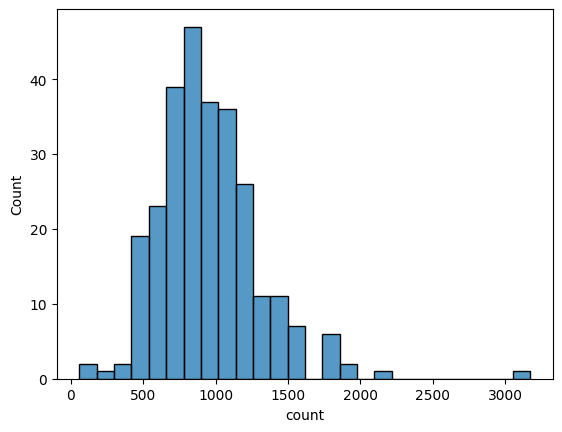

In [13]:
sns.histplot(data = crimes_per_beat)
# So we can see that this is apporximetley normally distributed with a couple of outliers


<Axes: ylabel='count'>

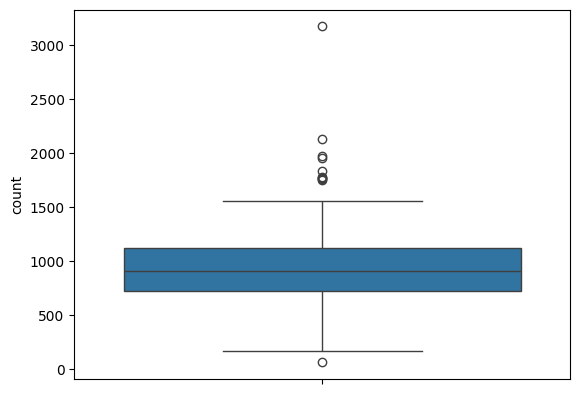

In [14]:
sns.boxplot(data = crimes_per_beat)

In [15]:
df_arrests = df[df["ARREST"] == "Y"]
# Here we can see the top 10 beats with the most arrests made. The top beat is 1834 which is the beat that includes navy pier. I don't usually think of navy pier as a place with a lot of crime, but I guess I was wrong. 
# I used https://www.chicagocityscape.com/maps/index.php#/?places_type=chipolicebeat&search_term=1831 to find out where the beats are located
arrests_per_beat = pd.Series(df_arrests['BEAT'].value_counts().sort_index())
arrests_per_beat 

BEAT
111     608
112     281
113     272
114      99
121      67
       ... 
2531     85
2532    111
2533    249
2534    154
2535    121
Name: count, Length: 271, dtype: int64

In [16]:
# Let's find if we get similar values when we limit the crimes only to murders
df_murders = df_arrests.loc[df_arrests[" PRIMARY_DESCRIPTION"] == "HOMICIDE"]
df_murders_per_beat = df_murders['BEAT'].value_counts().sort_values(ascending=False)
df_murders_per_beat

BEAT
632     5
623     4
921     3
333     3
1032    3
       ..
1722    1
714     1
2013    1
913     1
323     1
Name: count, Length: 98, dtype: int64

In [17]:
# Let's find if we get similar values when we limit the crimes only to thefts
df_thefts = df_arrests.loc[df_arrests[" PRIMARY_DESCRIPTION"] == "THEFT"]
df_thefts_per_beat = df_thefts['BEAT'].value_counts().sort_index(ascending= True)
df_thefts_per_beat


BEAT
111     298
112     184
113       7
114       6
121       3
       ... 
2531      8
2532      3
2533     36
2534      3
2535      4
Name: count, Length: 242, dtype: int64

2. Now were going to find the best predictor for the number of arrests made. 

In [18]:
# This is a function to calcuate the r squared for our questions 2 and 3
import math 
def calculate_r_squared(dataframe, x_idx, y_idx):
    column_names = dataframe.columns.to_list()
    x_column = column_names[x_idx]
    y_column = column_names[y_idx]
    x_mean = dataframe[x_column].mean()
    y_mean = dataframe[y_column].mean()

    # This calculates the S_xx and S_yy. I
    x_variance = pd.Series((dataframe[x_column] - x_mean) ** 2)
    y_variance = pd.Series((dataframe[y_column] - y_mean) ** 2)
 

    # Calculate the S_xy
    covariance = pd.Series((dataframe[x_column] - x_mean) * (dataframe[y_column] - y_mean))
    
    # This calculates the sums for the S_xx, S_yy and S_xy columns
    s_xx_sum = x_variance.sum()
    s_yy_sum = y_variance.sum()
    s_xy_sum = covariance.sum()

    # This finds the r and r squared values
    r = s_xy_sum / (math.sqrt(s_xx_sum) * math.sqrt(s_yy_sum))
    r_squared = r ** 2
    return r_squared


population 2 0.02215597745347898
square_mileage 3 0.024794259655794817
45-49 15 0.026701535757889975
25-29 19 0.02705479044427061
22-29 29 0.02708401454395484
percent_on_fs 37 0.05268561424820512


<Axes: xlabel='percent_on_fs', ylabel='arrests'>

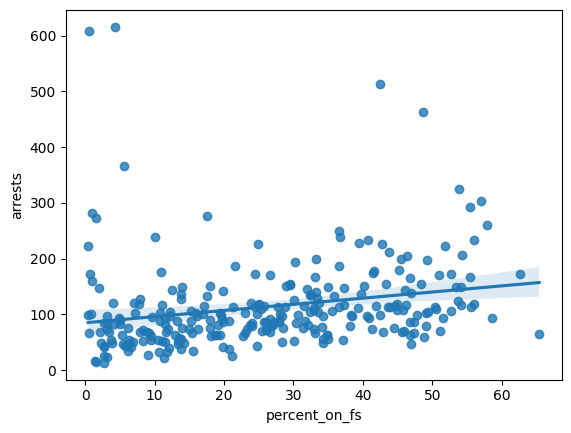

In [28]:
# This is the function that we will use to calculate the r squared value for the data. 
# It uses index column 0 and x and 1 as y where we use x to predict y. 
# the function goes calculate_r_squared(dataframe, x_idx, y_idx) where x_idx and y_idx are the index of the columns 
# that we want to use to calculate the r squared value. 
demo = pd.read_csv("demographics.csv")
demo.insert(1, "arrests", arrests_per_beat.values)
highest_r_squared = 0
column_names = demo.columns.to_list() # This allows me to output the column names for the 
# for the highest r squared values columns 
for i in range(2, 62):
    # This if statements checks the r squared value between each column of demographic data and the arrest date
    # and if it is higher than the 
    # previous r squared value it prints the column name, index and the r squared value.
    if calculate_r_squared(demo,i,1) >= highest_r_squared:
        highest_r_squared = calculate_r_squared(demo,i,1)
        print(column_names[i], i, calculate_r_squared(demo,i,1))
    else:
        continue
# It seems that percentage on food stamps is the best predictor of number of arrests made.
sns.regplot(data = demo, x = 'percent_on_fs', y = 'arrests' )

3. Now we are going ot find the best predictor for the number of crimes. 

population 2 0.013463029753834581
households 4 0.016077867639602873
21 21 0.025915523004470194
pop_food_stamps 36 0.10729309451070793


<Axes: xlabel='pop_food_stamps', ylabel='crimes'>

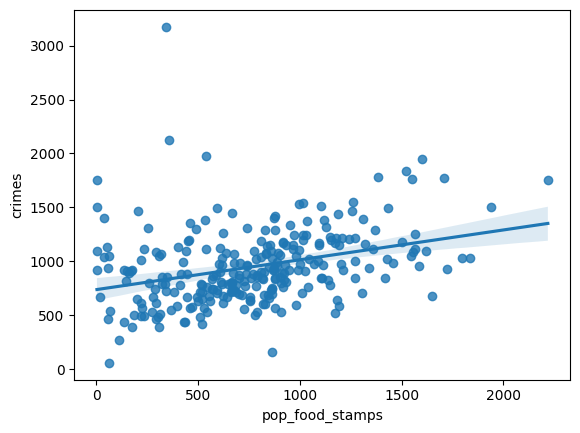

In [32]:
demo = pd.read_csv("demographics.csv")
demo.insert(1, "crimes", crimes_per_beat.values)
highest_r_squared = 0
column_names = demo.columns.to_list() # This allows me to output the column names for the 
# for the highest r squared values columns 
for i in range(2, 62):
    # This if statements checks the r squared value between each column of demographic data and the arrest date
    # and if it is higher than the  previous r squared value it prints the column name, index and the r squared value.
    if calculate_r_squared(demo,i,1) >= highest_r_squared:
        highest_r_squared = calculate_r_squared(demo,i,1)
        print(column_names[i], i, calculate_r_squared(demo,i,1))
    else:
        continue

# It seems that number of people on food stamps is the best predictor of number of crimes as well. Though
# food stamps are a better predictor of amount of crime than number of arrests as 
# evidenced by the r squared value.
sns.regplot(data = demo, x = 'pop_food_stamps', y = 'crimes' )

4. What is the most common reported crime and arrest reason in the dataset?

 PRIMARY_DESCRIPTION
THEFT                  56849
BATTERY                44238
CRIMINAL DAMAGE        29764
MOTOR VEHICLE THEFT    27583
ASSAULT                22647
Name: count, dtype: int64
 PRIMARY_DESCRIPTION
BATTERY              6940
WEAPONS VIOLATION    4881
NARCOTICS            4819
THEFT                2883
OTHER OFFENSE        2623
Name: count, dtype: int64


/var/folders/fz/ckrqtrgs0zqfznq4jsbhy6bw0000gn/T/ipykernel_16172/4284452320.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  plt.set_xticklabels(plt.get_xticklabels(), rotation=45)


<Axes: xlabel=' PRIMARY_DESCRIPTION', ylabel='count'>

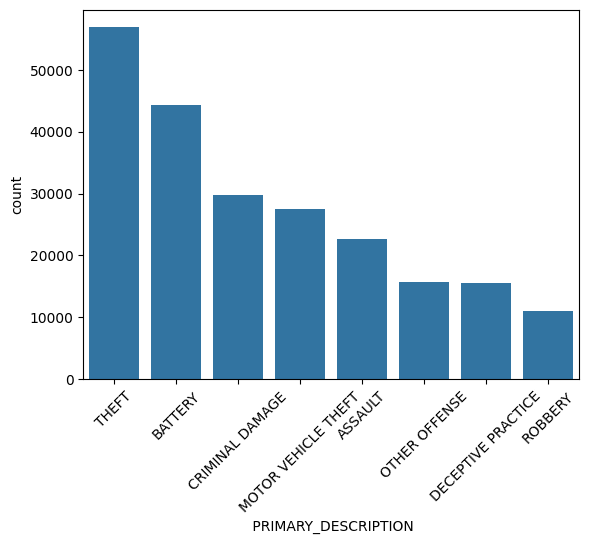

In [43]:
# Find the most common crime in the data set
df_crimes = df[" PRIMARY_DESCRIPTION"].value_counts().sort_values(ascending=False)
print(df_crimes.head(5))
# It seems that the most commonly reported crime is theft
# Now lets find the most common arrestable crime
df_arrest_crime = df_arrests[" PRIMARY_DESCRIPTION"].value_counts().sort_values(ascending=False)
print(df_arrest_crime.head(5))
# It seems that the most common crime to be arrested for is battery. 
plt = sns.barplot(data = df_crimes.head(8))
plt.set_xticklabels(plt.get_xticklabels(), rotation=45)
plt

5. Where in Chicago has the most crime for its population?

<Axes: xlabel='population', ylabel='crimes'>

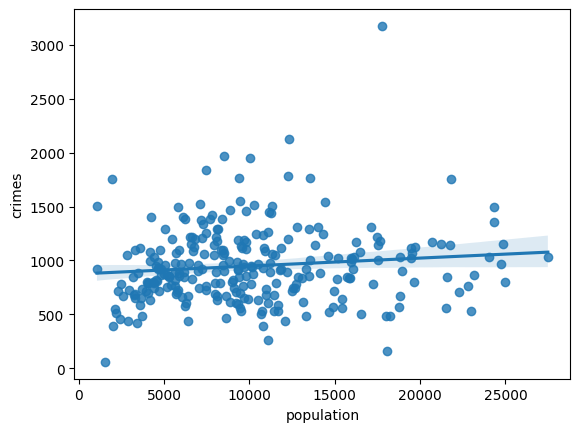

In [46]:
# Where in Chicago has the most crime for its population? 
demo['Crime_density'] = demo['crimes'] / demo['population']
demo_sort_crime_capita = demo.sort_values(by='Crime_density', ascending= False)
demo_sort_crime_capita.head(10)
# It seems that beat 112 which is in the middle of the loop has the highest crime density.
sns.regplot(data = demo, x = 'population', y = 'crimes')

In [ ]:
# Now let's see which youngsters are the best behaved
demo['Crime_density_young'] = demo['crimes'] / demo['youngPop']
demo.sort_values(by='Crime_density_young', ascending= False)
# It seems that beat 112 which is in the middle of the loop has the highest crime density yet again. I'm guessing it comes from plenty 
# of people going to the loop to work and then leaving the loop to go home.

Bonus: Let's plot the arrest data on an interactive map. 

In [47]:
import plotly.express as px
fig = px.scatter_mapbox(df_arrests,lat='LATITUDE',lon='LONGITUDE', hover_name=' PRIMARY_DESCRIPTION', hover_data=['BEAT', ' SECONDARY_DESCRIPTION', 'DATE_OF_OCCURRENCE'], zoom=10)
fig.update_layout(title = 'Chicago Crimes', title_x=0.5)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()